# TARGET : Develop a Customer Segmentation in such a way that it will be possible for the Marketing Department to better understand all the different Customers’ Profiles

# 1. Import the needed libraries

In [82]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from sklearn.impute import KNNImputer

# notice we are adding two new imports for visualizations; This was not here last class
from itertools import product
from pandas_profiling import ProfileReport

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

# 2. Import data

In [83]:
data_imported = pd.read_sas('a2z_insurance.sas7bdat')

# Matadata
CustID           Custom's ID

FirstPolYear       First Year of the customer’s first policy 

BirthYear         Customer’s birth year

EducDeg           Academic Degree

MonthSal          Gross monthly salary (€)

GeoLivArea         Living area

Children          Binary variable (Y=1)

CustMonVal        Customer Monetary Value Lifetime value = (annual profit from the customer) X (number of   years that they are a customer) -(acquisition cost)

ClaimsRate        Claims Rate: Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years

PremMotor        Premiums (€) in LOB: Motor

PremHousehold     Premiums (€) in LOB: Household 

PremHealth       Premiums (€) in LOB: Health

PremLife         Premiums (€) in LOB: Life

PremWork         Premiums (€) in LOB: Work Compensations

# 3. Explore the data

It is time to explore and understand the data we have.

In [84]:
data = data_imported.copy()
data.dtypes

CustID           float64
FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [85]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296.0,NaN,NaN,NaN,5148.5,2972.34352,1.0,2574.75,5148.5,7722.25,10296.0
FirstPolYear,10266.0,NaN,NaN,NaN,1991.062634,511.267913,1974.0,1980.0,1986.0,1992.0,53784.0
BirthYear,10279.0,NaN,NaN,NaN,1968.007783,19.709476,1028.0,1953.0,1968.0,1983.0,2001.0
EducDeg,10279,4,b'3 - BSc/MSc',4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.0,NaN,NaN,NaN,2506.667057,1157.449634,333.0,1706.0,2501.5,3290.25,55215.0
GeoLivArea,10295.0,NaN,NaN,NaN,2.709859,1.266291,1.0,1.0,3.0,4.0,4.0
Children,10275.0,NaN,NaN,NaN,0.706764,0.455268,0.0,0.0,1.0,1.0,1.0
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10262.0,NaN,NaN,NaN,300.470252,211.914997,-4.11,190.59,298.61,408.3,11604.42


drop the 'GeoLivArea' column and 'CustID'

In [86]:
data=data.drop(columns=['GeoLivArea','CustID'])

In [87]:
# Define metric and non-metric features. 
non_metric_features = ["EducDeg", "Children"]
metric_features = data.columns.drop(non_metric_features).to_list()

# 4. Modify the data

fill the missing value 

fill the missing value of Premiums part by 0

In [88]:
data.iloc[:,-5:]=data.iloc[:,-5:].fillna(0)

Fill in the missing values of 'FirstPolYear' and 'BirthYear', 
from the corresponding positions of 'FirstPolYear' and 'BirthYear'

In [89]:
# KNNImputer - only works for numerical variables
imputer = KNNImputer(n_neighbors=5, weights="uniform")
data['BirthYear'] = imputer.fit_transform(data[metric_features])

In [90]:
# KNNImputer - only works for numerical variables
imputer = KNNImputer(n_neighbors=5, weights="uniform")
data['FirstPolYear'] = imputer.fit_transform(data[metric_features])

In [91]:
# find the error in the first pol year
data.loc[data['FirstPolYear']>2016] 

,FirstPolYear,BirthYear,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
9294,53784.0,53784.0,b'3 - BSc/MSc',3268.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


In [92]:
data=data.drop([9294])

change the columns 'FirstPolYear' and 'BirthYear' to 'member_age' and 'age' and transfer the value to be numerical

data['FirstPolYear']=2016-data['FirstPolYear']
data['BirthYear']=2016-data['BirthYear']

data = data.rename(columns={'FirstPolYear':'member_age','BirthYear':'age'})

fill the missing value of Education colunm by most frequent value

In [93]:
data['EducDeg']=data['EducDeg'].fillna(data['EducDeg'].mode().loc[0])

fill the missing value of Monthly salary by the median numebr

In [94]:
data['MonthSal'] = data['MonthSal'].fillna(data['MonthSal'].median())

fill the missing value in the 'Children' colunm by most frequent value

In [95]:
data['Children'] = data['Children'].fillna(data['Children'].mode().loc[0])

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10295 entries, 0 to 10295
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10295 non-null  float64
 1   BirthYear      10295 non-null  float64
 2   EducDeg        10295 non-null  object 
 3   MonthSal       10295 non-null  float64
 4   Children       10295 non-null  float64
 5   CustMonVal     10295 non-null  float64
 6   ClaimsRate     10295 non-null  float64
 7   PremMotor      10295 non-null  float64
 8   PremHousehold  10295 non-null  float64
 9   PremHealth     10295 non-null  float64
 10  PremLife       10295 non-null  float64
 11  PremWork       10295 non-null  float64
dtypes: float64(11), object(1)
memory usage: 1.0+ MB


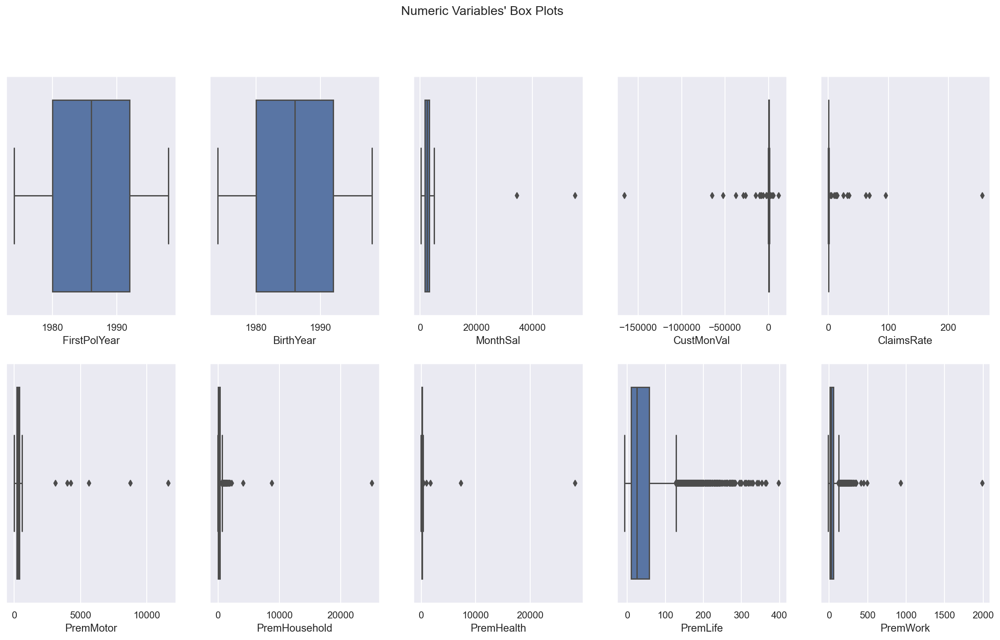

In [97]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=data[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)
plt.show()

# Outliers

In [99]:
q25 = data.quantile(.25)
q75 =data.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(data[metric].between(llim, ulim, inclusive=True))

data_2 = data[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(data_2.shape[0] / data.shape[0], 4))

Percentage of data kept after removing outliers: 0.8557


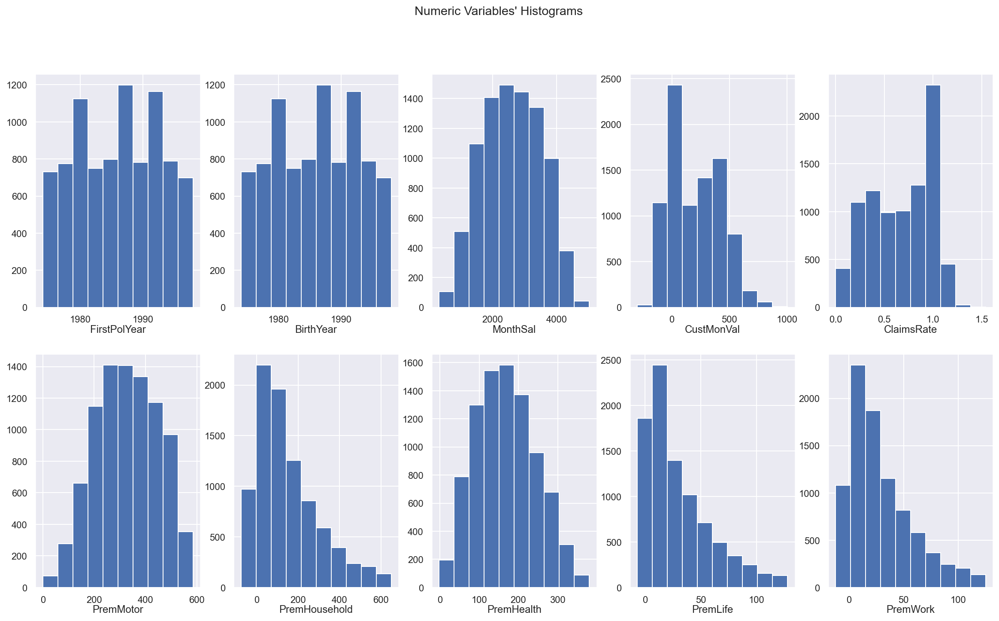

In [102]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    ax.hist(data_2[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

Outliers of MonthSal

In [81]:
MonthSal_mean = data['MonthSal'].mean()
MonthSal_std = data['MonthSal'].std()

data.loc[data['MonthSal'] > MonthSal_mean + 3 * MonthSal_std]

,FirstPolYear,BirthYear,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
5882,1995.0,1995.0,b'2 - High School',55215.0,1.0,122.25,0.79,281.83,147.25,130.58,84.46,66.68
8261,1981.0,1981.0,b'2 - High School',34490.0,0.0,608.89,0.28,57.01,358.95,195.26,113.80,161.14


In [61]:
data=data.drop(data.loc[data['MonthSal'] > MonthSal_mean + 3 * MonthSal_std].index)

Outliers of CustMonVal

In [62]:
CustMonVal_mean = data['CustMonVal'].mean()
CustMonVal_std = data['CustMonVal'].std()

data.loc[data['CustMonVal'] > CustMonVal_mean + 2 * CustMonVal_std]

,FirstPolYear,BirthYear,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
5293,1989.0,1989.0,b'3 - BSc/MSc',3564.0,1.0,11875.89,0.09,11604.42,48.90,1045.52,103.13,296.47
6701,1995.0,1995.0,b'3 - BSc/MSc',2947.0,0.0,4328.50,0.03,4273.49,83.90,105.13,3.00,3.89
7085,1992.0,1992.0,b'3 - BSc/MSc',2460.0,1.0,5596.84,0.01,5645.50,-25.55,49.01,1.89,1.89


In [64]:
data.loc[data['CustMonVal'] < CustMonVal_mean -3 * CustMonVal_std]

,FirstPolYear,BirthYear,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
51,1982.0,1982.0,b'3 - BSc/MSc',3234.0,1.0,-14714.08,25.36,557.44,20.00,29.56,5.00,-9.00
112,1997.0,1997.0,b'4 - PhD',2354.0,1.0,-8719.04,15.65,518.32,4.45,55.90,3.89,10.89
135,1997.0,1997.0,b'3 - BSc/MSc',2176.0,1.0,-10198.91,14.80,297.61,162.80,143.36,136.47,-3.00
171,1990.0,1990.0,b'3 - BSc/MSc',1086.0,1.0,-165680.42,256.20,378.07,78.90,166.81,6.89,18.45
655,1974.0,1974.0,b'3 - BSc/MSc',3279.0,1.0,-64891.00,96.00,410.30,117.25,95.35,37.34,22.56
675,1994.0,1994.0,b'2 - High School',4435.0,0.0,-52382.76,63.00,197.48,280.60,276.94,51.12,38.34
707,1991.0,1991.0,b'3 - BSc/MSc',1634.0,1.0,-28945.40,35.00,175.70,319.50,294.39,44.12,16.89
758,1988.0,1988.0,b'3 - BSc/MSc',1117.0,1.0,-10107.37,12.60,193.37,342.85,276.94,8.78,47.23
793,1980.0,1980.0,b'3 - BSc/MSc',1370.0,1.0,-7851.17,13.90,127.58,48.35,398.41,19.56,12.78
917,1986.0,1986.0,b'2 - High School',3355.0,0.0,-26130.45,32.30,135.58,290.05,221.82,86.46,100.13


In [23]:
data=data.drop(data.loc[data['CustMonVal'] > CustMonVal_mean + 2 * CustMonVal_std].index)

Outliers of Claims Rate

In [24]:
ClaimsRate_mean = data['ClaimsRate'].mean()
ClaimsRate_std = data['ClaimsRate'].std()

data.loc[data['ClaimsRate'] > ClaimsRate_mean + 5 * ClaimsRate_std ]

,member_age,age,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
51,34.0,50.0,b'3 - BSc/MSc',3234.0,1.0,-14714.08,25.36,557.44,20.00,29.56,5.00,-9.00
112,19.0,37.0,b'4 - PhD',2354.0,1.0,-8719.04,15.65,518.32,4.45,55.90,3.89,10.89
171,26.0,27.0,b'3 - BSc/MSc',1086.0,1.0,-165680.42,256.20,378.07,78.90,166.81,6.89,18.45
655,42.0,53.0,b'3 - BSc/MSc',3279.0,1.0,-64891.00,96.00,410.30,117.25,95.35,37.34,22.56
675,22.0,79.0,b'2 - High School',4435.0,0.0,-52382.76,63.00,197.48,280.60,276.94,51.12,38.34
707,25.0,25.0,b'3 - BSc/MSc',1634.0,1.0,-28945.40,35.00,175.70,319.50,294.39,44.12,16.89
917,30.0,64.0,b'2 - High School',3355.0,0.0,-26130.45,32.30,135.58,290.05,221.82,86.46,100.13
9648,26.0,66.0,b'3 - BSc/MSc',3574.0,0.0,-37327.08,69.00,319.06,-25.55,245.38,4.89,4.78


In [25]:
data=data.drop(data.loc[data['ClaimsRate'] > ClaimsRate_mean + 5 * ClaimsRate_std ].index)

Outliers of PremMotor

In [26]:
PremMotor_mean = data['PremMotor'].mean()
PremMotor_std = data['PremMotor'].std()

data.loc[data['PremMotor'] > PremMotor_mean + 2 * PremMotor_std ]

,member_age,age,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
5128,20.0,73.0,b'1 - Basic',3763.0,0.0,466.21,0.90,4003.44,612.9,137.36,121.69,31.34
5211,35.0,73.0,b'2 - High School',4135.0,0.0,130.14,0.99,8744.61,101.7,1767.00,155.14,130.58
7904,42.0,57.0,b'3 - BSc/MSc',2354.0,1.0,-46.89,1.01,3106.62,30.0,59.01,12.89,9.00


In [27]:
data=data.drop(data.loc[data['PremMotor'] > PremMotor_mean + 2 * PremMotor_std].index)

Outliers of PremHousehold

In [28]:
PremHousehold_mean = data['PremHousehold'].mean()
PremHousehold_std = data['PremHousehold'].std()

data.loc[data['PremHousehold'] > PremHousehold_mean + 5 * PremHousehold_std ]

,member_age,age,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
6343,35.0,67.0,b'2 - High School',2642.0,1.0,0.78,0.99,424.19,4130.70,118.69,15.67,41.45
6835,41.0,50.0,b'3 - BSc/MSc',2832.0,1.0,-31.00,1.00,535.10,8762.80,41.12,-6.00,9.78
8425,40.0,20.0,b'1 - Basic',427.0,1.0,-61.34,1.02,16.67,2223.75,37.45,36.34,67.79
8866,38.0,44.0,b'2 - High School',2618.0,1.0,473.54,0.98,508.43,25048.80,36.23,9.89,11.89


In [29]:
data=data.drop(data.loc[data['PremHousehold'] > PremHousehold_mean + 5 * PremHousehold_std ].index)

Outliers of PremHealth

In [30]:
PremHealth_mean = data['PremHealth'].mean()
PremHealth_std = data['PremHealth'].std()

data.loc[data['PremHealth'] > PremHealth_mean + 1 * PremHealth_std ]

,member_age,age,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
7961,21.0,74.0,b'3 - BSc/MSc',4002.0,0.0,1457.99,0.83,431.86,107.80,7322.48,12.89,930.44
9149,31.0,22.0,b'2 - High School',987.0,1.0,804.05,0.97,26.34,829.05,28272.00,65.68,138.25


In [31]:
data=data.drop(data.loc[data['PremHealth'] > PremHealth_mean + 1 * PremHealth_std ].index)

# Data analyst

<function matplotlib.pyplot.show(close=None, block=None)>

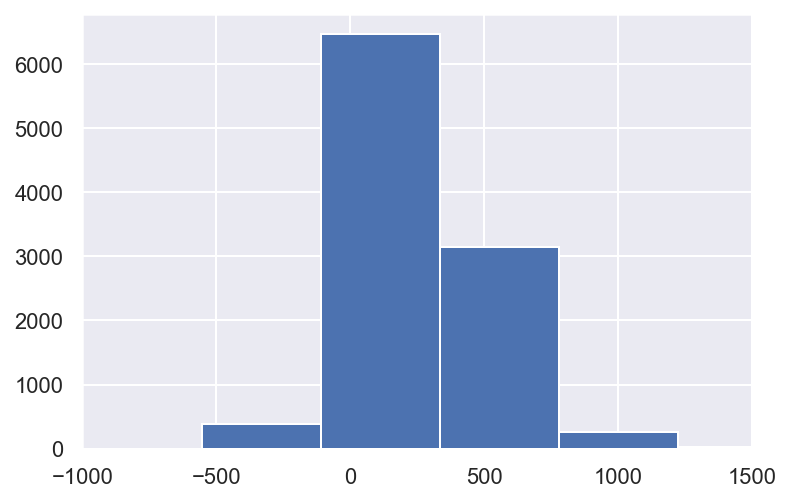

In [105]:
# plot the CustMonVal in histgram
plt.hist(data['CustMonVal'],bins=400)
plt.xlim(-1000, 1500)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

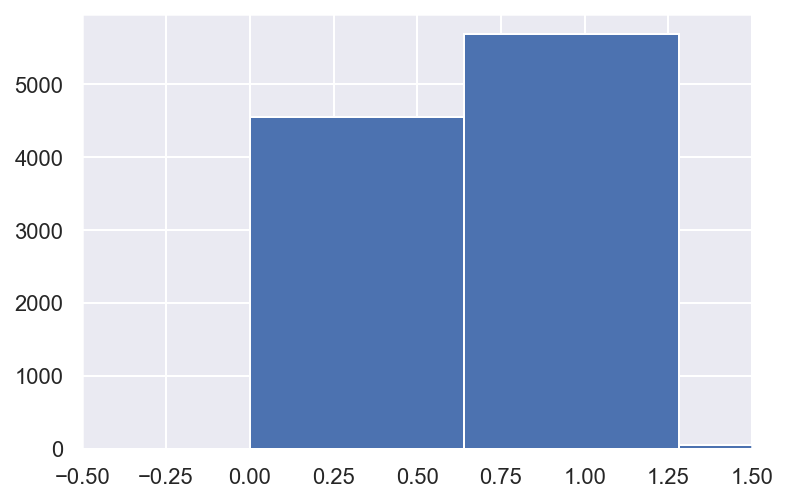

In [106]:
# plot the claimsrate in histgram
plt.hist(data['ClaimsRate'],bins=400)
plt.xlim(-0.5, 1.5)
plt.show

In [34]:
profile = ProfileReport(
    data, 
    title='Insurance Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

In [35]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Define metric and non-metric features. 

In [36]:
non_metric_features = ["EducDeg", "Children"]
metric_features = data.columns.drop(non_metric_features).to_list()

C:\Users\Desmond\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Desmond\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


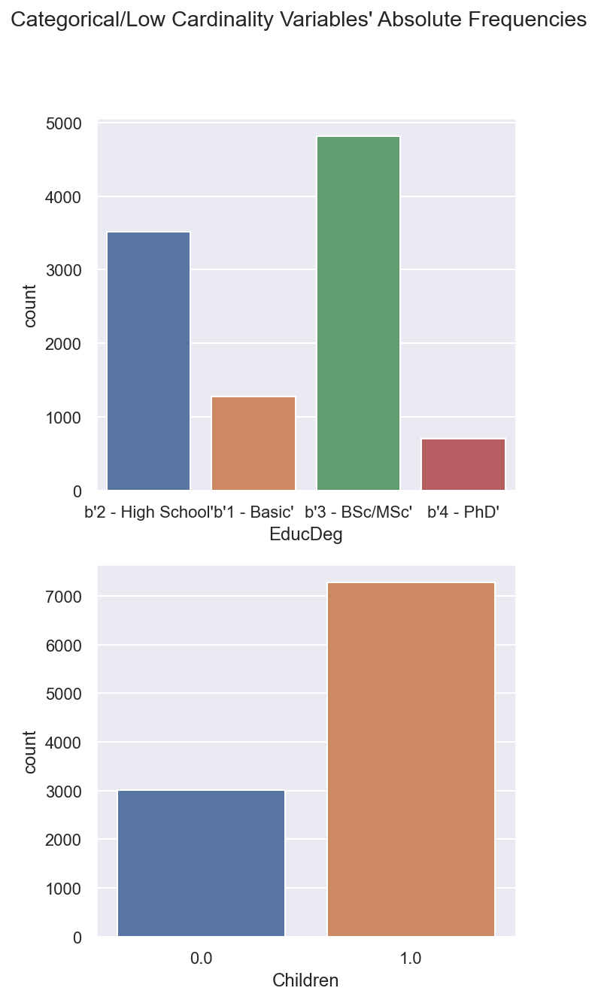

In [104]:
# All Non-Metric Variables' Absolute Frequencies
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(5, 10))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    sns.countplot(data[feat].astype(object), ax=ax,)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
plt.show()

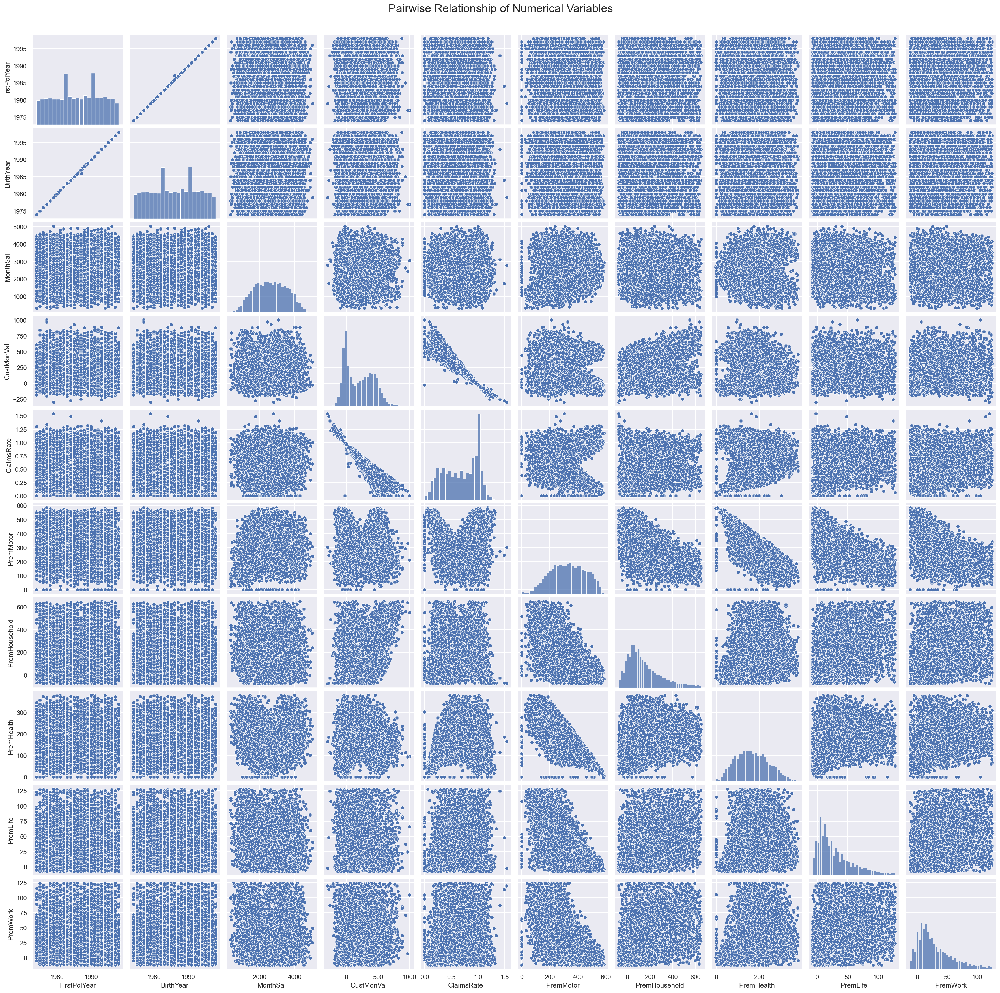

In [103]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(data_2[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()